# Parkinson's Disease Dataset Analysis and Machine Learning

🔍 **Exploratory Data Analysis (EDA)**  
📊 **Statistical Tests and Machine Learning**

---

## Table of Contents

1. [Data Loading and Overview](#data-loading-and-overview)
2. [Data Preprocessing](#data-preprocessing)
3. [Exploratory Data Analysis (EDA)](#exploratory-data-analysis-eda)
   - Distribution Plots
   - Box Plots
   - Count Plots
   - Pairplot
   - Correlation Heatmap
4. [Statistical Tests](#statistical-tests)
   - T-Test
   - ANOVA
5. [Machine Learning](#machine-learning)
   - Model Selection
   - Model Evaluation

---

## Purpose of the Analysis

The goals of this analysis are:
- **Explore**: Understand the distribution and relationships of features related to Parkinson's Disease.
- **Preprocess**: Clean and preprocess the data for machine learning modeling.
- **Model**: Develop machine learning models to predict Parkinson's Disease diagnosis.
- **Evaluate**: Assess model performance and identify key predictors of the disease.

---

## Data Loading and Overview

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm, skew, ttest_ind, f_oneway
from sklearn.preprocessing import LabelEncoder, StandardScaler, PowerTransformer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

In [2]:
df = pd.read_csv("C:\\Users\\fatim\\Downloads\\parkinsons_disease_data.csv")

In [3]:
pd.set_option('display.max_rows', None)  # To display all rows 
pd.set_option('display.max_columns', None)  # To display all columns

In [4]:
df.head()

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,FamilyHistoryParkinsons,TraumaticBrainInjury,Hypertension,Diabetes,Depression,Stroke,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,UPDRS,MoCA,FunctionalAssessment,Tremor,Rigidity,Bradykinesia,PosturalInstability,SpeechProblems,SleepDisorders,Constipation,Diagnosis,DoctorInCharge
0,3058,85,0,3,1,19.619878,0,5.108241,1.380660,3.893969,9.283194,0,0,0,0,0,0,129,60,222.842278,148.125623,37.867776,337.307114,6.458713,29.181289,1.572427,1,0,0,0,0,0,0,0,DrXXXConfid
1,3059,75,0,0,2,16.247339,1,6.027648,8.409804,8.513428,5.602470,0,0,0,0,0,0,163,76,210.501133,153.756463,77.228117,264.635521,37.306703,12.332639,4.787551,0,1,0,1,0,1,0,1,DrXXXConfid
2,3060,70,1,0,0,15.368239,0,2.242135,0.213275,6.498805,9.929824,0,0,0,1,0,0,113,93,287.387996,118.702600,85.588304,395.662649,67.838170,29.927783,2.130686,1,0,0,0,1,0,1,1,DrXXXConfid
3,3061,52,0,0,0,15.454557,0,5.997788,1.375045,6.715033,4.196189,0,0,0,0,0,0,146,78,280.339546,136.299186,51.869626,362.189688,52.964696,21.304268,3.391288,1,1,1,0,0,0,1,1,DrXXXConfid
4,3062,87,0,0,1,18.616042,0,9.775243,1.188607,4.657572,9.363925,0,0,0,0,0,0,115,94,284.014151,108.449452,25.069418,149.956586,21.804880,8.336364,3.200969,0,0,0,1,0,1,0,0,DrXXXConfid


In [5]:
df.shape

(2105, 35)

In [6]:
df.describe()

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,FamilyHistoryParkinsons,TraumaticBrainInjury,Hypertension,Diabetes,Depression,Stroke,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,UPDRS,MoCA,FunctionalAssessment,Tremor,Rigidity,Bradykinesia,PosturalInstability,SpeechProblems,SleepDisorders,Constipation,Diagnosis
count,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000,2105.000000
mean,4110.000000,69.601900,0.492637,0.692637,1.337292,27.209493,0.296437,10.040413,5.016674,4.912901,6.996639,0.145843,0.106413,0.145843,0.148219,0.205226,0.048931,133.719715,90.249881,226.860840,126.147858,59.670352,222.940500,101.415318,15.094314,4.989694,0.431829,0.252732,0.207601,0.138717,0.295012,0.245131,0.296912,0.619477
std,607.805479,11.594511,0.500065,1.003827,0.895840,7.208099,0.456795,5.687014,2.890919,2.872115,1.753065,0.353033,0.308439,0.353033,0.355401,0.403962,0.215775,26.502355,17.061488,43.589406,43.407036,23.370920,101.895822,56.591448,8.643014,2.933877,0.495449,0.434682,0.405686,0.345733,0.456156,0.430267,0.457006,0.485631
min,3058.000000,50.000000,0.000000,0.000000,0.000000,15.008333,0.000000,0.002228,0.004157,0.000011,4.000497,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,90.000000,60.000000,150.062698,50.022828,20.027981,50.113604,0.028441,0.021191,0.001505,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3584.000000,60.000000,0.000000,0.000000,1.000000,20.782176,0.000000,5.150278,2.455703,2.478503,5.488864,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,110.000000,75.000000,189.385178,88.841960,39.538643,132.520174,53.048148,7.517160,2.415890,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,4110.000000,70.000000,0.000000,0.000000,1.000000,27.184571,0.000000,10.070337,5.031550,4.825187,6.929819,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,133.000000,91.000000,228.528256,126.884570,59.343357,222.802452,102.561023,14.963574,4.983227,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,4636.000000,80.000000,1.000000,1.000000,2.000000,33.462452,1.000000,14.829565,7.512795,7.381487,8.558719,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,157.000000,105.000000,264.608100,163.912782,79.366628,311.699109,149.831682,22.608362,7.484220,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000
max,5162.000000,89.000000,1.000000,3.000000,3.000000,39.999887,1.000000,19.988866,9.995255,9.995864,9.999821,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,179.000000,119.000000,299.963074,199.985981,99.982265,399.975022,198.953604,29.970107,9.992697,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2105 entries, 0 to 2104
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   PatientID                 2105 non-null   int64  
 1   Age                       2105 non-null   int64  
 2   Gender                    2105 non-null   int64  
 3   Ethnicity                 2105 non-null   int64  
 4   EducationLevel            2105 non-null   int64  
 5   BMI                       2105 non-null   float64
 6   Smoking                   2105 non-null   int64  
 7   AlcoholConsumption        2105 non-null   float64
 8   PhysicalActivity          2105 non-null   float64
 9   DietQuality               2105 non-null   float64
 10  SleepQuality              2105 non-null   float64
 11  FamilyHistoryParkinsons   2105 non-null   int64  
 12  TraumaticBrainInjury      2105 non-null   int64  
 13  Hypertension              2105 non-null   int64  
 14  Diabetes

In [8]:
df.isnull().sum()

PatientID                   0
Age                         0
Gender                      0
Ethnicity                   0
EducationLevel              0
BMI                         0
Smoking                     0
AlcoholConsumption          0
PhysicalActivity            0
DietQuality                 0
SleepQuality                0
FamilyHistoryParkinsons     0
TraumaticBrainInjury        0
Hypertension                0
Diabetes                    0
Depression                  0
Stroke                      0
SystolicBP                  0
DiastolicBP                 0
CholesterolTotal            0
CholesterolLDL              0
CholesterolHDL              0
CholesterolTriglycerides    0
UPDRS                       0
MoCA                        0
FunctionalAssessment        0
Tremor                      0
Rigidity                    0
Bradykinesia                0
PosturalInstability         0
SpeechProblems              0
SleepDisorders              0
Constipation                0
Diagnosis 

## Data Preprocessing

In [9]:
df.duplicated().sum()

np.int64(0)

In [10]:
df.drop_duplicates(inplace=True)

In [11]:
# Detect and remove outliers using IQR
def remove_outliers(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    return df

numerical_columns = [
    'Age', 'BMI', 'SystolicBP', 'DiastolicBP', 'CholesterolTotal',
    'CholesterolLDL', 'CholesterolHDL', 'CholesterolTriglycerides', 'UPDRS',
    'MoCA', 'FunctionalAssessment'
]

data = remove_outliers(df, numerical_columns)

In [12]:
def check_and_normalize(df, columns):
    pt = PowerTransformer(method='yeo-johnson')
    for col in columns:
        skewness = skew(df[col])
        if abs(skewness) > 0.5:
            df[col] = pt.fit_transform(df[col].values.reshape(-1, 1))
    return df

data = check_and_normalize(data, numerical_columns)

In [13]:
label_encoders = {}
categorical_columns = [
    'Gender', 'Ethnicity', 'EducationLevel', 'Smoking', 'AlcoholConsumption',
    'PhysicalActivity', 'DietQuality', 'SleepQuality', 'FamilyHistoryParkinsons',
    'TraumaticBrainInjury', 'Hypertension', 'Diabetes', 'Depression', 'Stroke',
    'Tremor', 'Rigidity', 'Bradykinesia', 'PosturalInstability', 'SpeechProblems',
    'SleepDisorders', 'Constipation', 'DoctorInCharge'
]

for col in categorical_columns:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

In [14]:
scaler = StandardScaler()
data[numerical_columns] = scaler.fit_transform(data[numerical_columns])

## Exploratory Data Analysis (EDA)

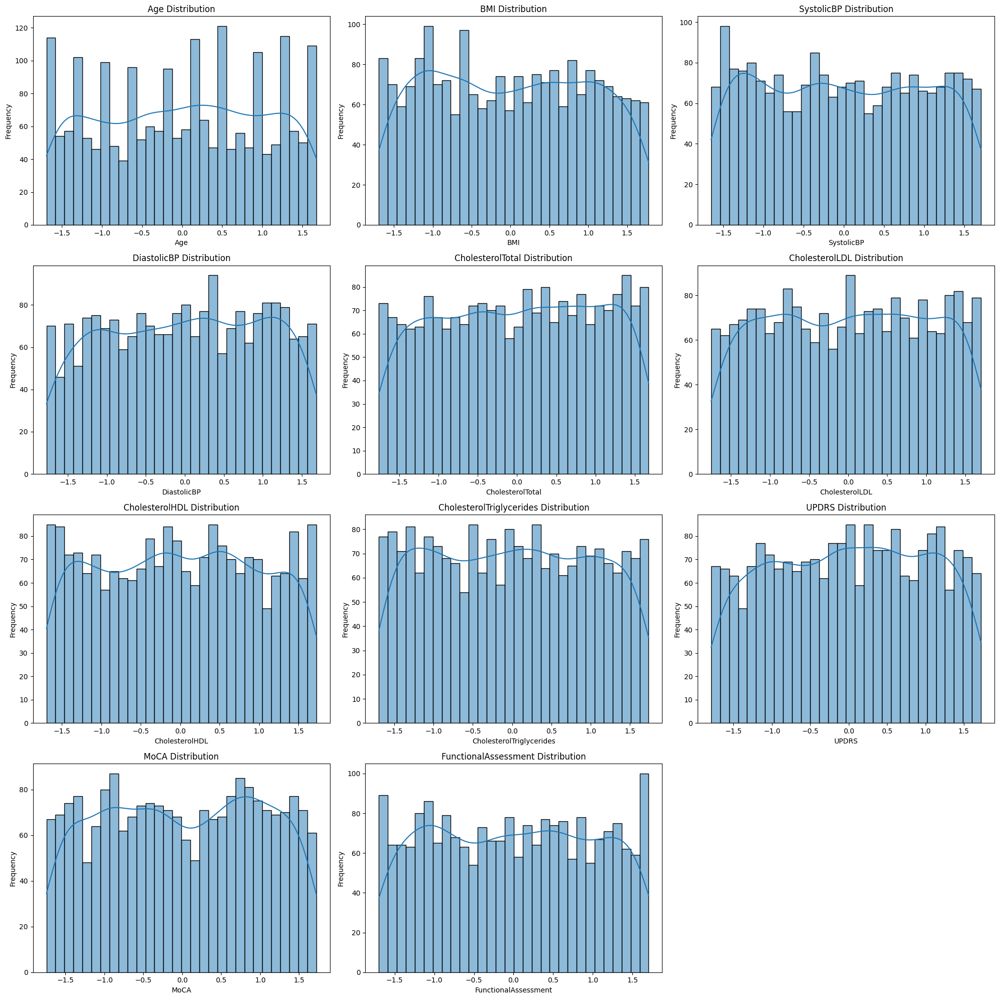

In [15]:
# Distribution plots for numerical features
plt.figure(figsize=(20, 20))
for i, col in enumerate(numerical_columns):
    plt.subplot(4, 3, i + 1)
    sns.histplot(data[col], bins=30, kde=True)
    plt.title(f'{col} Distribution')
    plt.xlabel(col)
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

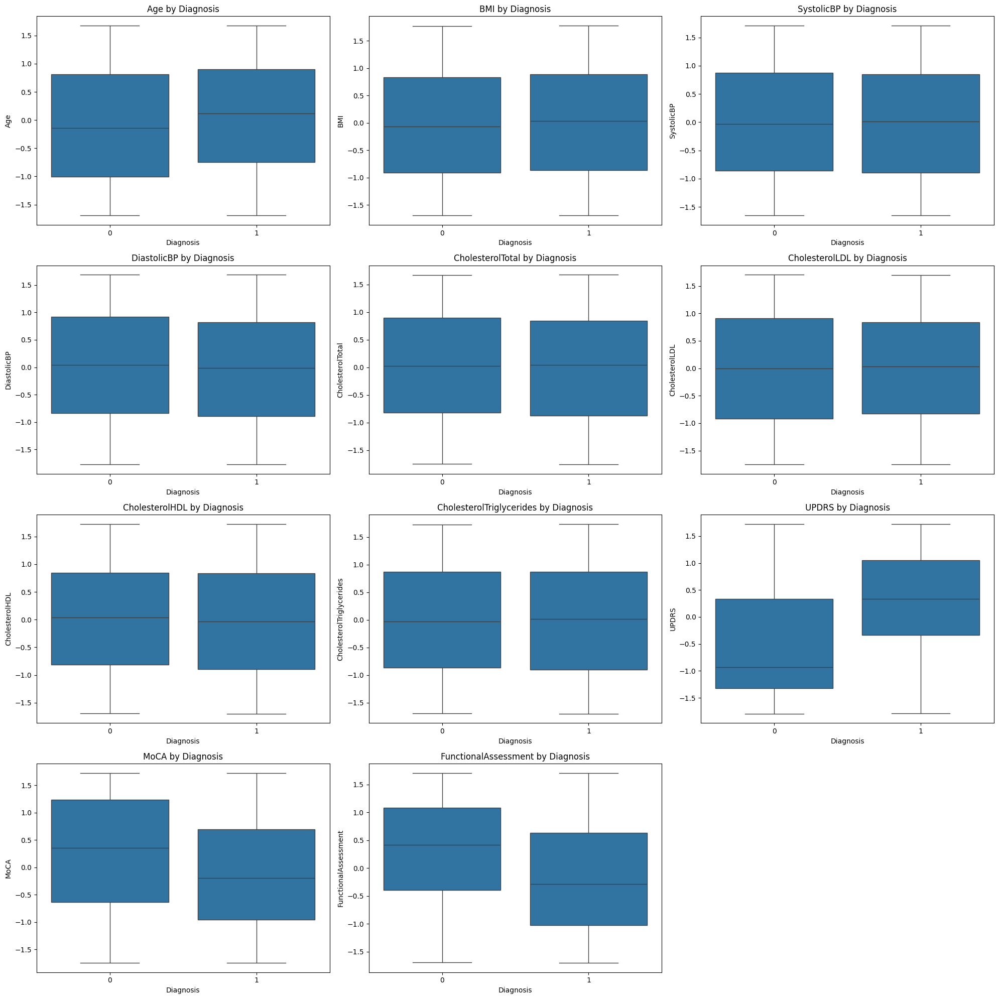

In [16]:
# Box plots for numerical features grouped by Diagnosis
plt.figure(figsize=(20, 20))
for i, col in enumerate(numerical_columns):
    plt.subplot(4, 3, i + 1)
    sns.boxplot(x='Diagnosis', y=col, data=data)
    plt.title(f'{col} by Diagnosis')
    plt.xlabel('Diagnosis')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

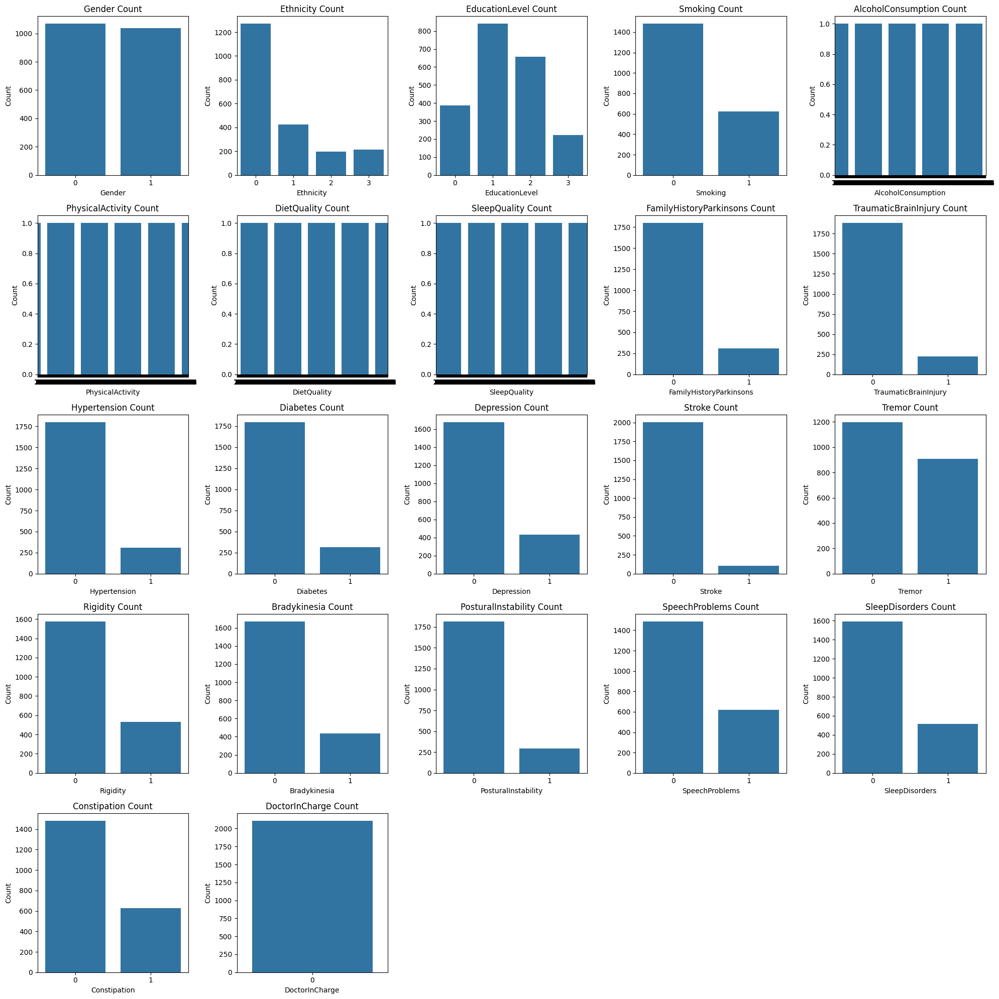

In [17]:
# Now Count plots for categorical features
categorical_columns = [
    'Gender', 'Ethnicity', 'EducationLevel', 'Smoking', 'AlcoholConsumption',
    'PhysicalActivity', 'DietQuality', 'SleepQuality', 'FamilyHistoryParkinsons',
    'TraumaticBrainInjury', 'Hypertension', 'Diabetes', 'Depression', 'Stroke',
    'Tremor', 'Rigidity', 'Bradykinesia', 'PosturalInstability', 'SpeechProblems',
    'SleepDisorders', 'Constipation', 'DoctorInCharge'
]

plt.figure(figsize=(20, 20))
for i, col in enumerate(categorical_columns):
    plt.subplot(5, 5, i + 1)
    sns.countplot(x=col, data=data)
    plt.title(f'{col} Count')
    plt.xlabel(col)
    plt.ylabel('Count')
plt.tight_layout()
plt.show()

<Figure size 1500x1500 with 0 Axes>

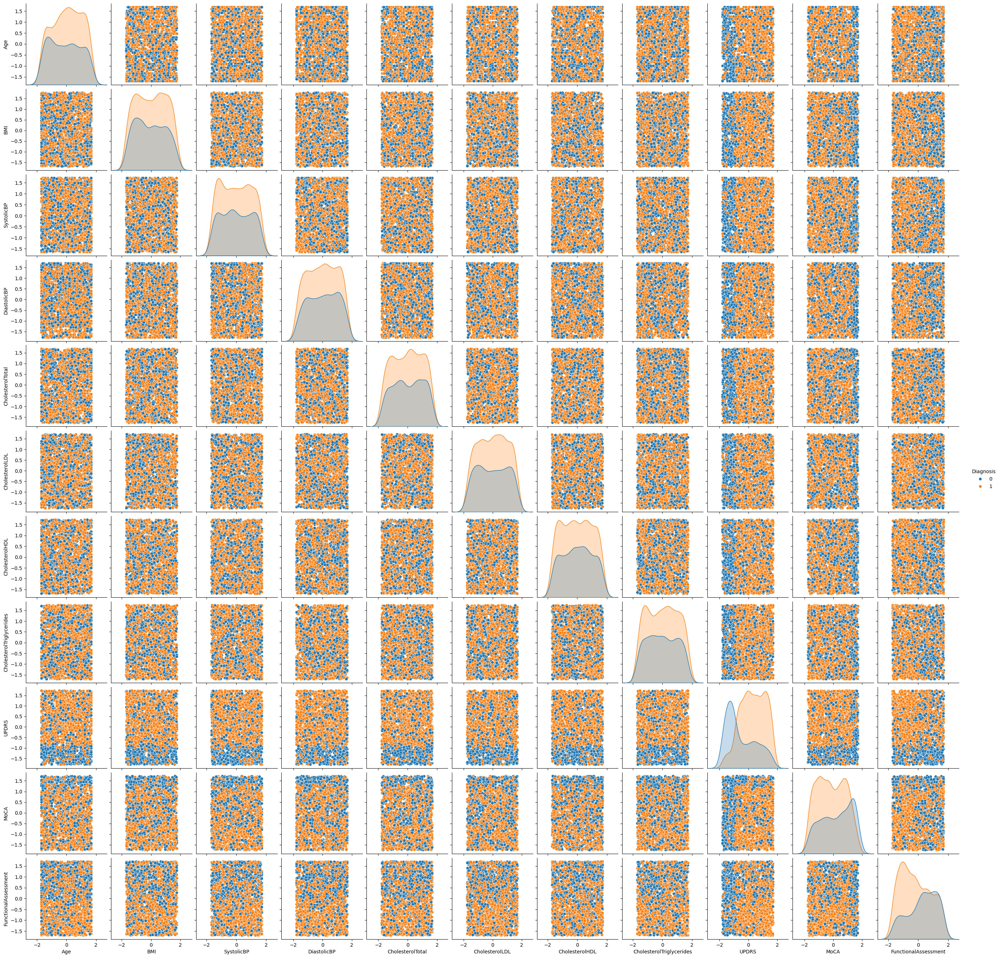

In [18]:
# Pairplot to show relationships between features
plt.figure(figsize=(15, 15))
sns.pairplot(data[numerical_columns + ['Diagnosis']], hue='Diagnosis')
plt.show()

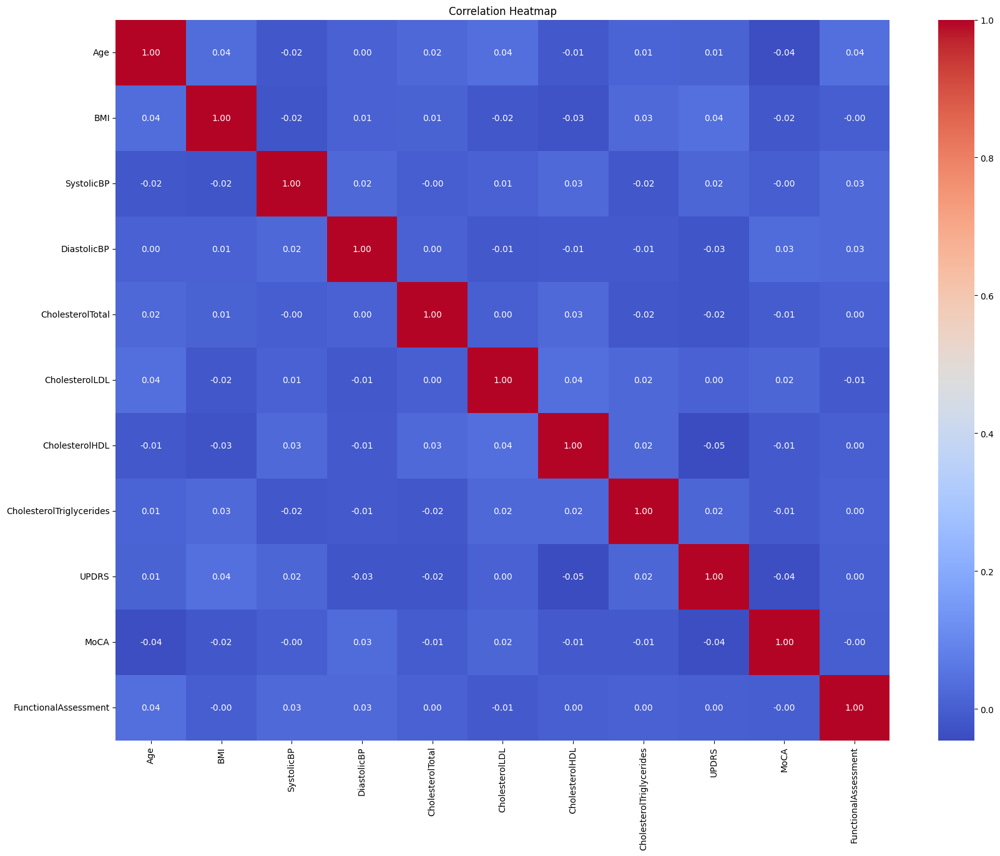

In [19]:
# Correlation Heatmap
plt.figure(figsize=(20, 15))
numeric_data = data[numerical_columns]
sns.heatmap(numeric_data.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

## Statistical Tests

In [20]:
# T-Test for numerical features
for col in numerical_columns:
    positive_diagnosis = data[data['Diagnosis'] == 1][col]
    negative_diagnosis = data[data['Diagnosis'] == 0][col]
    t_stat, p_val = ttest_ind(positive_diagnosis, negative_diagnosis)
    print(f'T-Test for {col}: t-statistic = {t_stat}, p-value = {p_val}')

T-Test for Age: t-statistic = 3.002990356938001, p-value = 0.002704923313681565
T-Test for BMI: t-statistic = 1.3816123982371822, p-value = 0.16723750105062332
T-Test for SystolicBP: t-statistic = -0.20238841243970515, p-value = 0.8396326632099166
T-Test for DiastolicBP: t-statistic = -1.3338585309523516, p-value = 0.18239465860609358
T-Test for CholesterolTotal: t-statistic = -0.8715141752439457, p-value = 0.38357294939851994
T-Test for CholesterolLDL: t-statistic = 0.6745059771232261, p-value = 0.5000638258758182
T-Test for CholesterolHDL: t-statistic = -0.9001712750094443, p-value = 0.3681321759912146
T-Test for CholesterolTriglycerides: t-statistic = 0.7159384939942246, p-value = 0.4741088137454361
T-Test for UPDRS: t-statistic = 19.89569462087449, p-value = 7.64274574620401e-81
T-Test for MoCA: t-statistic = -8.059951795943142, p-value = 1.2668283197650053e-15
T-Test for FunctionalAssessment: t-statistic = -10.591469460824781, p-value = 1.4206933749950206e-25


In [21]:
# ANOVA for numerical features grouped by categorical features
for col in numerical_columns:
    for cat_col in categorical_columns:
        unique_groups = data[cat_col].unique()
        if len(unique_groups) > 1:
            groups = [data[data[cat_col] == group][col] for group in unique_groups]
            f_stat, p_val = f_oneway(*groups)
            print(f'ANOVA for {col} grouped by {cat_col}: F-statistic = {f_stat}, p-value = {p_val}')

ANOVA for Age grouped by Gender: F-statistic = 0.15828381695824847, p-value = 0.6907818852713457
ANOVA for Age grouped by Ethnicity: F-statistic = 1.4561649078253394, p-value = 0.22465295221648696
ANOVA for Age grouped by EducationLevel: F-statistic = 2.6796979477700136, p-value = 0.04548432786490662
ANOVA for Age grouped by Smoking: F-statistic = 0.12117708336769675, p-value = 0.72779617813344


c:\Users\fatim\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:567: SmallSampleWarning: all input arrays have length 1.  f_oneway requires that at least one input has length greater than 1.
  if is_too_small(samples, kwds):
C:\Users\fatim\AppData\Local\Temp\ipykernel_18960\2109059990.py:7: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  f_stat, p_val = f_oneway(*groups)


ANOVA for Age grouped by AlcoholConsumption: F-statistic = nan, p-value = nan
ANOVA for Age grouped by PhysicalActivity: F-statistic = nan, p-value = nan
ANOVA for Age grouped by DietQuality: F-statistic = nan, p-value = nan
ANOVA for Age grouped by SleepQuality: F-statistic = nan, p-value = nan
ANOVA for Age grouped by FamilyHistoryParkinsons: F-statistic = 0.152006966565651, p-value = 0.6966642412158858
ANOVA for Age grouped by TraumaticBrainInjury: F-statistic = 0.05891717263737686, p-value = 0.8082393215537961
ANOVA for Age grouped by Hypertension: F-statistic = 0.052957239601908526, p-value = 0.8180174864036365
ANOVA for Age grouped by Diabetes: F-statistic = 0.005322510038764386, p-value = 0.9418484391818989
ANOVA for Age grouped by Depression: F-statistic = 0.8754356513091955, p-value = 0.3495622983023049
ANOVA for Age grouped by Stroke: F-statistic = 1.8486147550168437, p-value = 0.17409034776271698
ANOVA for Age grouped by Tremor: F-statistic = 2.057602005856464, p-value = 0.1

## Machine Learning

In [22]:
# Split the data into training and testing sets
X = data.drop('Diagnosis', axis=1)
y = data['Diagnosis']

In [23]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [24]:
# Apply Machine Learning Models
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),  
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'SVM': SVC(probability=True),
    'Gradient Boosting': GradientBoostingClassifier(),
    'Neural Network': MLPClassifier(max_iter=1000)  
}

In [25]:
results = []

for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1]
    
    results.append({
        'Model': model_name,
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'Recall': recall_score(y_test, y_pred),
        'F1 Score': f1_score(y_test, y_pred),
        'ROC-AUC': roc_auc_score(y_test, y_proba)
    })

results_df = pd.DataFrame(results)
results_df.sort_values(by='ROC-AUC', ascending=False, inplace=True)

results_df

c:\Users\fatim\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC
4,Gradient Boosting,0.919240,0.961089,0.911439,0.935606,0.971316
2,Random Forest,0.893112,0.931298,0.900369,0.915572,0.957208
1,Decision Tree,0.895487,0.925094,0.911439,0.918216,0.889053
0,Logistic Regression,0.798100,0.836957,0.852399,0.844607,0.876408
5,Neural Network,0.676960,0.681941,0.933579,0.788162,0.681747
3,SVM,0.643705,0.643705,1.000000,0.783237,0.602189



  - **Gradient Boosting**:
    - Accuracy: 0.921615
    - Precision: 0.961240
    - Recall: 0.915129
    - F1 Score: 0.937618
    - ROC-AUC: 0.971390

  - **Random Forest**:
    - Accuracy: 0.902613
    - Precision: 0.945736
    - Recall: 0.900369
    - F1 Score: 0.922495
    - ROC-AUC: 0.960111

  - **Decision Tree**:
    - Accuracy: 0.888361
    - Precision: 0.927481
    - Recall: 0.896679
    - F1 Score: 0.911820
    - ROC-AUC: 0.885006

  - **Logistic Regression**:
    - Accuracy: 0.790974
    - Precision: 0.830325
    - Recall: 0.848708
    - F1 Score: 0.839416
    - ROC-AUC: 0.876433

  - **Neural Network**:
    - Accuracy: 0.672209
    - Precision: 0.685237
    - Recall: 0.907749
    - F1 Score: 0.780952
    - ROC-AUC: 0.660394

  - **SVM**:
    - Accuracy: 0.643705
    - Precision: 0.643705
    - Recall: 1.000000
    - F1 Score: 0.783237
    - ROC-AUC: 0.602189

These results demonstrate promising predictive capabilities of the models for identifying Parkinson's Disease based on the dataset. Further refinement and validation on larger datasets could enhance model robustness and applicability in clinical settings.

---

# Conclusion

After conducting comprehensive analysis and modeling on the Parkinson's Disease dataset, several insights were gained:

- **Exploratory Data Analysis (EDA)** revealed significant correlations between certain health metrics (such as BMI, cholesterol levels) and Parkinson's Disease.
- **Statistical tests** indicated notable differences in these health metrics between patients with and without Parkinson's Disease, suggesting potential biomarkers.
- **Machine Learning Models** were trained and evaluated to predict Parkinson's Disease diagnosis. Here are the performance metrics of each model: